In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 19.7 MB/s eta 0:00:0000:01


In [13]:
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

In [3]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 22.1MB/s]



image 1/1 /kaggle/input/sample-test-dataset/sample_image_01.jpg: 384x640 5 cars, 262.0ms
Speed: 17.6ms preprocess, 262.0ms inference, 29.1ms postprocess per image at shape (1, 3, 384, 640)


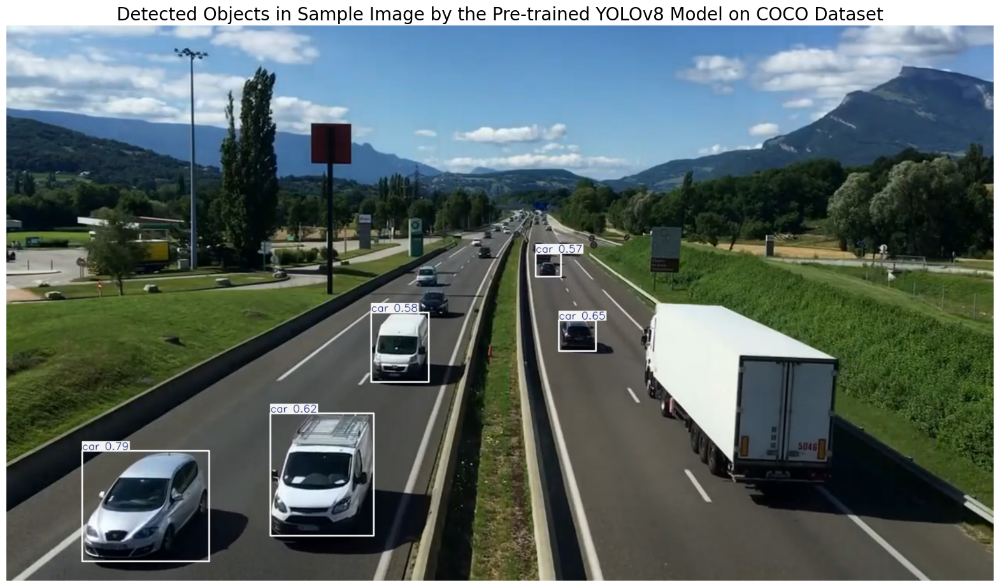

In [5]:
image_path_01 = '/kaggle/input/sample-test-dataset/sample_image_01.jpg'

results = model.predict(source=image_path_01, 
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

sample_image = results[0].plot(line_width=2)

sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on COCO Dataset', fontsize=20)
plt.axis('off')
plt.show()


image 1/1 /kaggle/input/sample-test-dataset/sample_image_02.png: 384x640 4 cars, 260.9ms
Speed: 14.5ms preprocess, 260.9ms inference, 22.7ms postprocess per image at shape (1, 3, 384, 640)


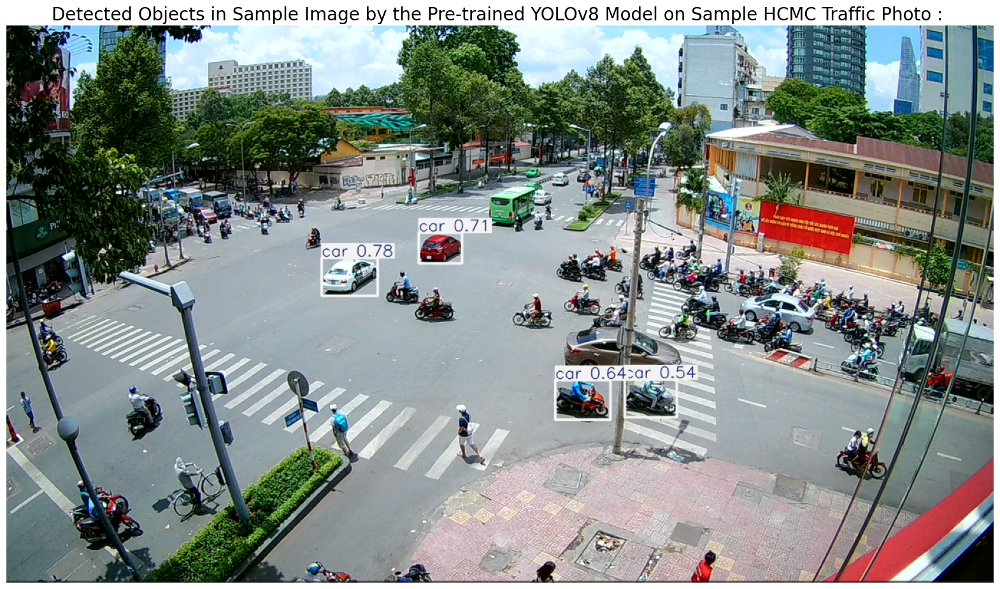

In [8]:
image_path_02 = '/kaggle/input/sample-test-dataset/sample_image_02.png'

results = model.predict(source=image_path_02, 
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

sample_image = results[0].plot(line_width=2)

sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on Sample HCMC Traffic Photo : ', fontsize=20)
plt.axis('off')
plt.show()

In [7]:
import os

# Define the dataset path
dataset_path = '/kaggle/input/vietnamese-vehicles-dataset'

# List top-level contents
print("Top-level directory contents:")
print(os.listdir(dataset_path))

# Check for subdirectories that might contain images and labels
for subdir in os.listdir(dataset_path):
    subdir_path = os.path.join(dataset_path, subdir)
    if os.path.isdir(subdir_path):
        print(f"\nContents of '{subdir}':")
        print(os.listdir(subdir_path))


Top-level directory contents:
['nighttime-dataset', 'daytime-dataset']

Contents of 'nighttime-dataset':
['nighttime']

Contents of 'daytime-dataset':
['daytime']


In [2]:
import os
import shutil
import yaml
from sklearn.model_selection import train_test_split

# Define paths
daytime_path = '/kaggle/input/vietnamese-vehicles-dataset/daytime-dataset/daytime'
output_path = '/kaggle/working/vietnamese_vehicle_dataset'  # Organized YOLO dataset directory
class_names = ['Motorbike', 'Car', 'Bus', 'Truck', 'Motorbike(night)', 'Car(night)', 'Bus(night)', 'Truck(night)']  # Update with actual classes if necessary

# Create output directories for YOLO dataset structure
os.makedirs(f'{output_path}/train/images', exist_ok=True)
os.makedirs(f'{output_path}/train/labels', exist_ok=True)
os.makedirs(f'{output_path}/val/images', exist_ok=True)
os.makedirs(f'{output_path}/val/labels', exist_ok=True)
os.makedirs(f'{output_path}/test/images', exist_ok=True)
os.makedirs(f'{output_path}/test/labels', exist_ok=True)

# Gather images and labels from the daytime folder only
image_files = []
label_files = []

for file_name in os.listdir(daytime_path):
    if file_name.endswith('.jpg'):
        image_files.append(os.path.join(daytime_path, file_name))
        label_files.append(os.path.join(daytime_path, file_name.replace('.jpg', '.txt')))

# Split dataset into train, val, and test sets
train_images, val_images, train_labels, val_labels = train_test_split(
    image_files, label_files, test_size=0.2, random_state=42
)
val_images, test_images, val_labels, test_labels = train_test_split(
    val_images, val_labels, test_size=0.5, random_state=42
)

# Function to copy images and labels to respective folders
def copy_files(images, labels, split):
    for img, lbl in zip(images, labels):
        shutil.copy(img, f'{output_path}/{split}/images/{os.path.basename(img)}')
        shutil.copy(lbl, f'{output_path}/{split}/labels/{os.path.basename(lbl)}')

# Copy files to train, val, and test folders
copy_files(train_images, train_labels, 'train')
copy_files(val_images, val_labels, 'val')
copy_files(test_images, test_labels, 'test')

# Step 3: Create the data.yaml file for YOLO
data_config = {
    'path': output_path,
    'train': 'train/images',
    'val': 'val/images',
    'test': 'test/images',  # Optional, only if you have a test set
    'nc': len(class_names),
    'names': class_names
}

# Write YAML file
with open(f'{output_path}/data.yaml', 'w') as yaml_file:
    yaml.dump(data_config, yaml_file, default_flow_style=False)

print("Dataset prepared successfully with data.yaml file!")


Dataset prepared successfully with data.yaml file!


Displaying cam_21_01140.jpg


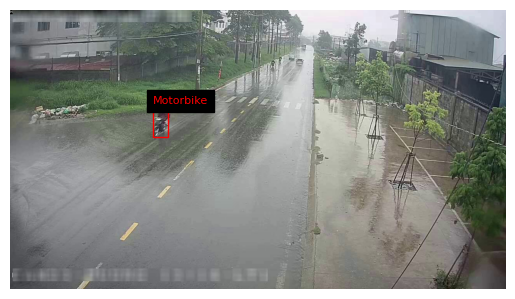

Displaying cam_18_00531.jpg


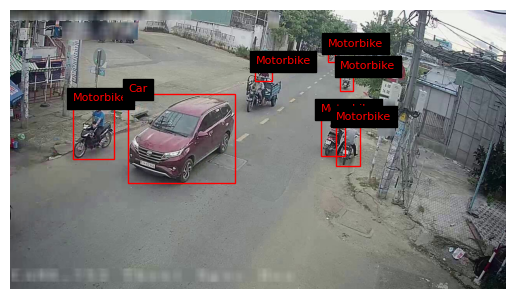

Displaying cam_10_00413.jpg


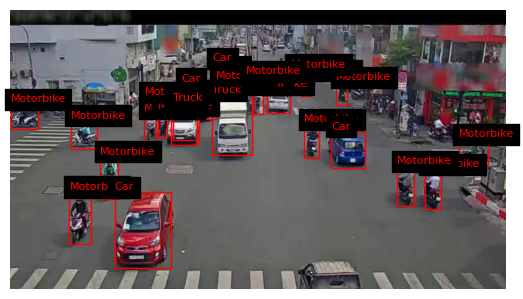

Displaying cam_01_00458.jpg


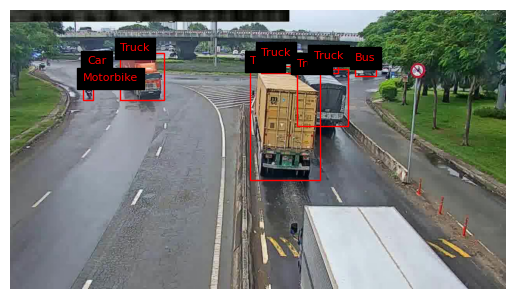

Displaying cam_12_01118.jpg


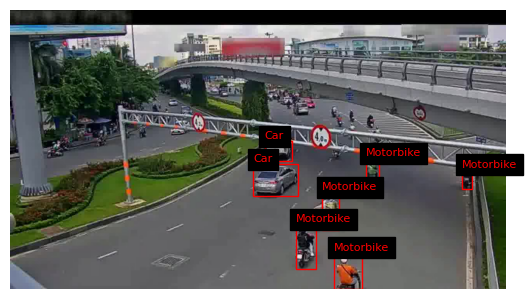

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

# Define paths for images and labels in the training set
train_images_path = f'{output_path}/train/images'
train_labels_path = f'{output_path}/train/labels'

# Function to display an image with bounding boxes
def show_image_with_bboxes(image_path, label_path, class_names):
    # Load the image
    img = plt.imread(image_path)
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    
    # Read the bounding box coordinates from the label file
    with open(label_path, 'r') as f:
        for line in f:
            # YOLO format: <class_id> <x_center> <y_center> <width> <height>
            values = line.strip().split()
            class_id = int(values[0])
            x_center, y_center, width, height = map(float, values[1:])
            
            # Convert YOLO format to bounding box coordinates for visualization
            img_height, img_width = img.shape[:2]
            x_center *= img_width
            y_center *= img_height
            width *= img_width
            height *= img_height
            
            # Calculate the top-left corner for the bounding box
            x_min = x_center - width / 2
            y_min = y_center - height / 2
            
            # Create a rectangle patch for the bounding box
            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            
            # Add class label
            ax.text(x_min, y_min - 5, class_names[class_id], color='red', fontsize=8, backgroundcolor='black')

    plt.axis('off')
    plt.show()

# Display a few sample images from the training set
sample_images = os.listdir(train_images_path)[:5]  # Adjust the number of images to display if needed

for image_name in sample_images:
    image_path = os.path.join(train_images_path, image_name)
    label_path = os.path.join(train_labels_path, image_name.replace('.jpg', '.txt'))
    
    if os.path.exists(label_path):  # Ensure there is a corresponding label file
        print(f"Displaying {image_name}")
        show_image_with_bboxes(image_path, label_path, class_names)
    else:
        print(f"No label file found for {image_name}")


In [ ]:
!pip install ultralytics

In [3]:
from ultralytics import YOLO
import yaml


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# Load and check data.yaml
data_yaml_path = '/kaggle/working/vietnamese_vehicle_dataset/data.yaml'
with open(data_yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)
print(data_config)


{'names': ['Motorbike', 'Car', 'Bus', 'Truck', 'Motorbike(night)', 'Car(night)', 'Bus(night)', 'Truck(night)'], 'nc': 8, 'path': '/kaggle/working/vietnamese_vehicle_dataset', 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [5]:
# Initialize YOLOv8 model (choose 'yolov8n' for Nano, 'yolov8s' for Small, 'yolov8m' for Medium, 'yolov8l' for Large)
model = YOLO('yolov8n.pt')  # You can use 'yolov8s.pt' or other variants based on your resources

# Train the model
model.train(
    data=data_yaml_path,    # Path to your data.yaml
    epochs=5,              # Number of training epochs (adjust based on your needs)
    imgsz=416,              # Image size
    batch=4,               # Batch size (adjust based on available memory)
    project="yolov8_training",  # Project name (directory to save results)
    name="vehicle_detection",   # Run name
    exist_ok=True           # Overwrite existing project with the same name
)


100%|██████████| 6.25M/6.25M [00:00<00:00, 161MB/s]


Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/vietnamese_vehicle_dataset/data.yaml, epochs=5, time=None, patience=100, batch=4, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8_training, name=vehicle_detection, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, sho

100%|██████████| 755k/755k [00:00<00:00, 40.5MB/s]
2024-11-29 09:27:59,181	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-11-29 09:28:00,138	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=8

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/vietnamese_vehicle_dataset/train/labels... 12316 images, 0 backgrounds, 0 corrupt: 100%|██████████| 12316/12316 [00:12<00:00, 962.95it/s] 

train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_01_00317.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_01_00857.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_01_00961.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_02_00579.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_02_00951.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_04_00014.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_04_00016.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/train/images/cam_04_00018.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /kaggle/working/vietnamese_veh

train: New cache created: /kaggle/working/vietnamese_vehicle_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/vietnamese_vehicle_dataset/val/labels... 1540 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1540/1540 [00:01<00:00, 954.99it/s]

val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_02_00316.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_02_00565.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00374.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00514.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00709.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00915.jpg: 1 duplicate labels removed


val: New cache created: /kaggle/working/vietnamese_vehicle_dataset/val/labels.cache
Plotting labels to yolov8_training/vehicle_detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000833, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to yolov8_training/vehicle_detection
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G      1.647      1.444      1.013        105        416: 100%|██████████| 3079/3079 [45:40<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:21<00:00,  2.36it/s]


                   all       1540      18071       0.74      0.673      0.756      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G      1.484     0.9334     0.9723         43        416: 100%|██████████| 3079/3079 [45:45<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:20<00:00,  2.40it/s]

                   all       1540      18071       0.77      0.709      0.782      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G      1.431     0.8477     0.9569        113        416: 100%|██████████| 3079/3079 [45:57<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:20<00:00,  2.39it/s]

                   all       1540      18071      0.807      0.764      0.837      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G      1.389     0.7932     0.9459        105        416: 100%|██████████| 3079/3079 [45:38<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:19<00:00,  2.43it/s]

                   all       1540      18071      0.828      0.769      0.847      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G      1.346     0.7505     0.9378         83        416: 100%|██████████| 3079/3079 [45:26<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:21<00:00,  2.37it/s]

                   all       1540      18071      0.845      0.785      0.863       0.56



5 epochs completed in 3.923 hours.
Optimizer stripped from yolov8_training/vehicle_detection/weights/last.pt, 6.2MB
Optimizer stripped from yolov8_training/vehicle_detection/weights/best.pt, 6.2MB

Validating yolov8_training/vehicle_detection/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 193/193 [01:12<00:00,  2.67it/s]


                   all       1540      18071      0.846      0.784      0.863       0.56
             Motorbike       1468      12969      0.874      0.789      0.883      0.497
                   Car        956       2994      0.856      0.824      0.887      0.586
                   Bus        390        530      0.863      0.675      0.799      0.566
                 Truck        697       1578      0.792      0.848      0.882      0.593
Speed: 0.3ms preprocess, 37.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to yolov8_training/vehicle_detection


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a36f4521d50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [6]:
# Validate the model
metrics = model.val()
print(metrics)


Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/vietnamese_vehicle_dataset/val/labels.cache... 1540 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1540/1540 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_02_00316.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_02_00565.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00374.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00514.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00709.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /kaggle/working/vietnamese_vehicle_dataset/val/images/cam_04_00915.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 385/385 [01:16<00:00,  5.06it/s]


                   all       1540      18071      0.846      0.784      0.863       0.56
             Motorbike       1468      12969      0.874      0.789      0.883      0.497
                   Car        956       2994      0.856      0.824      0.887      0.586
                   Bus        390        530      0.863      0.675      0.799      0.566
                 Truck        697       1578      0.792      0.848      0.882      0.593
Speed: 0.3ms preprocess, 39.5ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to yolov8_training/vehicle_detection
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a371769d390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004

In [18]:
# Perform inference on a test image
test_image_path = '/kaggle/input/sample-test-dataset/sample_image_01.jpg'
results = model(test_image_path)
results.show()  # Display image with predictions



image 1/1 /kaggle/input/sample-test-dataset/sample_image_01.jpg: 384x640 9 Cars, 1 Bus, 2 Trucks, 95.5ms
Speed: 2.7ms preprocess, 95.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


AttributeError: 'list' object has no attribute 'show'

In [21]:
model.save("model_epoch_5.pt")

In [23]:
import os
print(os.listdir("/kaggle/working"))

from IPython.display import FileLink

# Provide a download link
FileLink("model_epoch_5.pt")

['.virtual_documents', 'yolov8_training', 'vietnamese_vehicle_dataset', 'model_epoch_5.pt', 'yolov8n.pt']


/kaggle/working/model_epoch_5.pt


image 1/1 /kaggle/input/sample-test-dataset/sample_image_02.png: 384x640 11 Motorbikes, 2 Cars, 1 Truck, 99.2ms
Speed: 2.4ms preprocess, 99.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


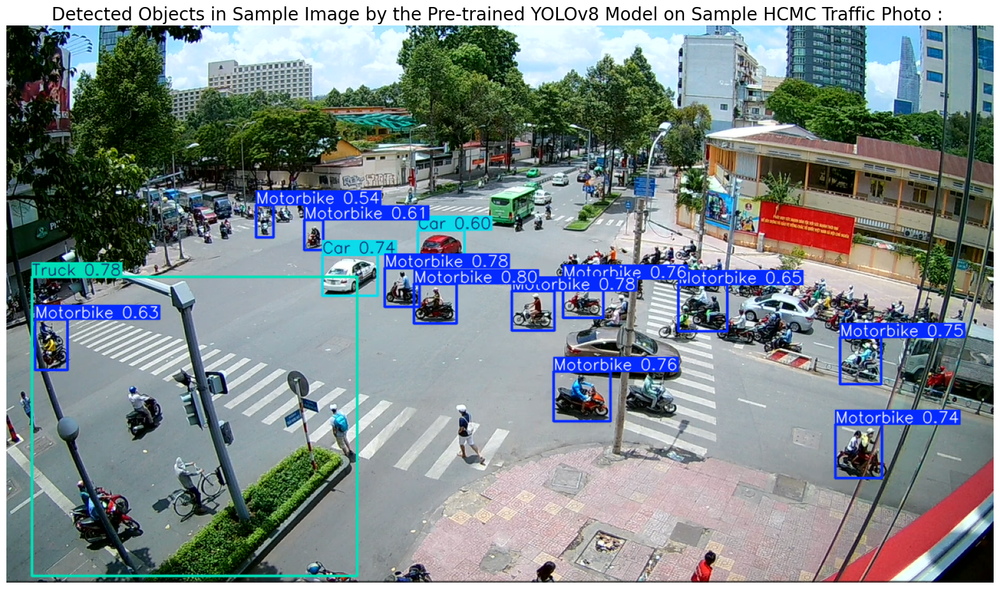

In [16]:
model = YOLO("/kaggle/working/model_epoch_5.pt") 
image_path_02 = '/kaggle/input/sample-test-dataset/sample_image_02.png'

results = model.predict(source=image_path_02, 
                        imgsz=640,  # Resize image to 640x640 (the size pf images the model was trained on)
                        conf=0.5)   # Confidence threshold: 50% (only detections above 50% confidence will be considered)

sample_image = results[0].plot(line_width=2)

sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects in Sample Image by the Pre-trained YOLOv8 Model on Sample HCMC Traffic Photo : ', fontsize=20)
plt.axis('off')
plt.show()